In [1]:
import os 
os.environ['GEOMSTATS_BACKEND'] = 'pytorch'

import geomstats._backend as gs 
import geometric_kernels.torch 

import torch 
import gpytorch 
import plotly.io as pio
from plotly import graph_objects as go
from plotly.subplots import make_subplots
from mdgp.samplers import VISampler, PosteriorSampler
from mdgp.kernels import GeometricMaternKernel
from geometric_kernels.spaces import Hyperbolic
from mdgp.samplers import RFFSampler
from geometric_kernels.kernels.matern_kernel import default_feature_map


torch.set_default_dtype(torch.float64)
pio.templates.default = "plotly_dark"

INFO: Using pytorch backend
/home/kacperwyrwal/miniconda3/envs/mdgp_requirements_test7/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
space = Hyperbolic(dim=2)
base_kernel = GeometricMaternKernel(space=space, num_random_phases=200, seed=0)
covar_module = gpytorch.kernels.ScaleKernel(base_kernel)
mean_module = gpytorch.means.ZeroMean()
num_random_phases = 1000

feature_map = default_feature_map(space=space, num=num_random_phases)
rff_sampler = RFFSampler(covar_module=covar_module, mean_module=mean_module, feature_map=feature_map)

/home/kacperwyrwal/miniconda3/envs/mdgp_requirements_test7/lib/python3.11/site-packages/mdgp/samplers/rff_sampler.py:25: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self._num_features = self.compute_features(torch.tensor(self.base_kernel.space.random_point()[None])).shape[-1]


In [13]:
def hyperbolic_grid(space, num_points=100): 
    s = torch.linspace(-5, 5, num_points)
    xx, yy = torch.meshgrid(s, s)
    points = torch.stack([xx, yy], dim=-1).reshape(-1, 2)
    points = space.from_coordinates(points, "intrinsic")
    return points

points = hyperbolic_grid(space=space, num_points=100)

/home/kacperwyrwal/miniconda3/envs/mdgp_requirements_test7/lib/python3.11/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


In [14]:
with torch.no_grad():
    torch.random.manual_seed(0)
    sample = rff_sampler(points, sample_shape=torch.Size([1000]))
    c = sample.var(dim=0)
    x, y, z = points.view(100, 100, -1).unbind(-1)

fig = go.Figure(data=[go.Surface(x=y, y=z, z=x, surfacecolor=c.view_as(x))])
fig.show()

In [15]:
import geomstats.visualization as visualization

<Axes: xlabel='X', ylabel='Y'>

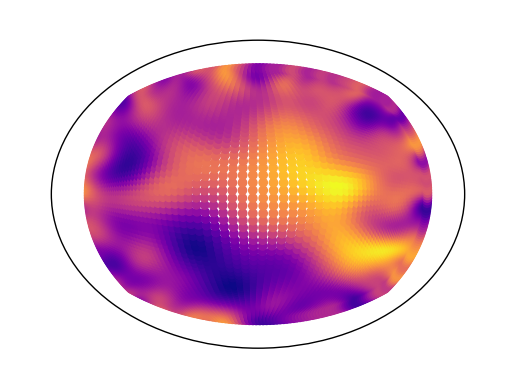

In [16]:
import numpy as np 
visualization.plot(points, space="H2_poincare_disk", c=c, cmap="plasma")

In [9]:
def target_function(tensor, m=5):
    x, y, _ = tensor.unbind(dim=-1)
    # Convert (x, y, z) to cylindrical coordinates (r, theta, z)
    theta = torch.atan2(y, x)
    return torch.sin(m * theta)


with torch.no_grad():
    c = target_function(points)
    x, y, z = points.view(100, 100, -1).unbind(-1)

fig = go.Figure(data=[go.Surface(x=y, y=z, z=x, surfacecolor=c.view_as(x))])
fig.show()

In [10]:
num_points = 10
inducing_points = hyperbolic_grid(space=space, num_points=num_points)
noise = 1e-5
inducing_covar = torch.sqrt(torch.eye(inducing_points.shape[0]) * noise)
inducing_mean = target_function(inducing_points)
prior_dist = gpytorch.distributions.MultivariateNormal(inducing_mean, inducing_covar)

variational_distribution = gpytorch.variational.CholeskyVariationalDistribution(
    num_inducing_points=inducing_points.shape[0],
)
variational_distribution.initialize_variational_distribution(prior_dist)
vi_sampler = VISampler(variational_distribution=variational_distribution)

In [11]:
with torch.no_grad():
    vi_samples = vi_sampler(torch.Size([3]))

fig = make_subplots(rows=1, cols=3, specs=[[{'type': 'surface'}, {'type': 'scatter3d'}, {'type': 'surface'}]], 
                    subplot_titles=["VI Sample 1", "VI Sample 2", "VI Sample 3"]) 
x, y, z = inducing_points.unbind(-1)
for i, vi_sample in enumerate(vi_samples, 1): 
    fig.add_trace(
        go.Scatter3d(
            x=y, 
            y=z,
            z=x,
            mode='markers',
            marker=dict(
                size=4,
                color=vi_sample, 
                coloraxis="coloraxis",
            ),
        ),
        row=1, col=i
    )

fig.update_layout(
    coloraxis=dict(
        colorscale="plasma", 
    )
)

fig.show()

In [12]:
# Reduce the variance of the prior to better show influence of inducing points 
posterior_sampler = PosteriorSampler(rff_sampler=rff_sampler, vi_sampler=vi_sampler, inducing_points=inducing_points)

In [13]:
with torch.no_grad():
    c = posterior_sampler(points)
    x, y, z = points.view(100, 100, -1).unbind(-1)
fig = go.Figure(data=[go.Surface(x=y, y=z, z=x, surfacecolor=c.view_as(x))])
fig.show()

# Train a GP

In [14]:
class ApproximateGP(gpytorch.models.ApproximateGP):
    def __init__(self, variational_distribution, inducing_points, mean_module, covar_module):
        variational_strategy = gpytorch.variational.VariationalStrategy(self, inducing_points, variational_distribution, learn_inducing_locations=False)
        super().__init__(variational_strategy)
        self.mean_module = mean_module
        self.covar_module = covar_module

    def forward(self, x, normalize=True):
        mean_x = self.mean_module(x)
        covar_x = self.covar_module(x, normalize=normalize)
        return gpytorch.distributions.MultivariateNormal(mean_x, covar_x)

In [15]:
model = ApproximateGP(variational_distribution, inducing_points, mean_module, covar_module)
likelihood = gpytorch.likelihoods.GaussianLikelihood()
train_inputs = hyperbolic_grid(space=space, num_points=50).view(-1, 3)
train_targets = target_function(train_inputs)

In [16]:
num_epochs = 200
model.train()
likelihood.train()


optimizer = torch.optim.Adam([
    {'params': model.parameters()},
    {'params': likelihood.parameters()},
], lr=0.01)

mll = gpytorch.mlls.VariationalELBO(likelihood, model, num_data=train_inputs.size(0))

for i in range(num_epochs):
    optimizer.zero_grad()
    output = model(train_inputs)
    loss = -mll(output, train_targets)
    print(f"Epoch {i+1}/{num_epochs}, Loss: {loss}", end="\r")
    loss.backward()
    optimizer.step()

In [17]:
with torch.no_grad():
    model.eval()
    preds = model(points).mean
    test_targets = target_function(points, m=5)

fig = make_subplots(rows=1, cols=2, specs=[[{'type': 'surface'}, {'type': 'scatter3d'},]], 
                    subplot_titles=["Posterior Mean", "Target"])
dim=0

fig.add_trace(
    go.Surface(
        x=y, 
        y=z,
        z=x,
        surfacecolor=preds.view_as(x),
        coloraxis="coloraxis",
    ),
    row=1, col=1
)


fig.add_trace(
    go.Surface(
        x=y, 
        y=z,
        z=x,
        surfacecolor=test_targets.view_as(x),
        coloraxis="coloraxis",
    ),
    row=1, col=2
)


fig.update_layout(
    coloraxis=dict(
        colorscale="plasma", 
    )
)

fig.show()

# Sampler with batch dimensions 

In [18]:
space = Hyperbolic(dim=2)
num_random_phases = 500
batch_shape = torch.Size([13])
base_kernel = GeometricMaternKernel(space=space, num_random_phases=num_random_phases, batch_shape=batch_shape)
covar_module = gpytorch.kernels.ScaleKernel(base_kernel, batch_shape=batch_shape)
mean_module = gpytorch.means.ZeroMean(batch_shape=batch_shape)
feature_map = default_feature_map(space=space, num=num_random_phases)
rff_sampler = RFFSampler(covar_module=covar_module, mean_module=mean_module, feature_map=feature_map, num_features=num_random_phases * 2)

### Small bug with batch_shape increasing the scale of the process. 

In [31]:
num_points = 25
points = hyperbolic_grid(space, num_points)
with torch.no_grad():
    torch.random.manual_seed(0)
    sample = rff_sampler(points, sample_shape=torch.Size([3]))
    c = sample[1, 3]
    x, y, z = points.view(num_points, num_points, -1).unbind(-1)

fig = go.Figure(data=[go.Surface(x=y, y=z, z=x, surfacecolor=c.view_as(x))])
fig.show()

In [21]:
num_points = 10
inducing_points = hyperbolic_grid(space=space, num_points=num_points)
noise = 1e-2
inducing_covar = torch.sqrt(torch.eye(inducing_points.shape[0]) * noise)
inducing_mean = target_function(inducing_points)
prior_dist = gpytorch.distributions.MultivariateNormal(inducing_mean, inducing_covar)

variational_distribution = gpytorch.variational.CholeskyVariationalDistribution(
    num_inducing_points=inducing_points.shape[0],
    batch_shape=batch_shape
)
variational_distribution.initialize_variational_distribution(prior_dist)
vi_sampler = VISampler(variational_distribution=variational_distribution)

In [22]:
posterior_sampler = PosteriorSampler(rff_sampler=rff_sampler, vi_sampler=vi_sampler, inducing_points=inducing_points)

In [26]:
with torch.no_grad():
    torch.random.manual_seed(0)
    sample = posterior_sampler(points)
    c = sample[1]
    x, y, z = points.view(25, 25, -1).unbind(-1)
fig = go.Figure(data=[go.Surface(x=y, y=z, z=x, surfacecolor=c.view_as(x))])
fig.show()